In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm, trange
import sctop as top

sns.set(context='talk', color_codes=True, palette='deep', style='whitegrid', font_scale=1.2,
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'figure.dpi':400, 'text.usetex':False}) #'axes.linewidth': 1.5

# 1. Load data
## Load alveolar gene expression profiles

In [2]:
mca, mca_metadata = top.load_basis('MC-KO')
lung_dev, lung_dev_metadata = top.load_basis('LD')

epithelial = lung_dev['Lung Early Epithelium Cell E12 LD21']
at1 = mca['Lung AT1 Cell WK6 KO22']
at2 = mca['Lung AT2 Cell WK6 KO22']

genes_in_common = np.intersect1d(epithelial.index, at1.index)
attractor_states = pd.concat([at1.loc[genes_in_common],
                              at2.loc[genes_in_common],
                              epithelial.loc[genes_in_common]
                             ], axis = 1)

attractor_states.columns = ['at1', 'at2', 'early epithelium']

N, P = attractor_states.shape

## Load list of marker genes

In [3]:
type_signatures = pd.read_csv('/project/biophys/mouse scRNA-seq/scTOP explorations/scTOP/manuscript/manuscript data/herriges_cell_type_signatures.csv')
AT1_signature = type_signatures.loc[:, 'Mouse_AT1'].dropna()

AT1_signature = np.intersect1d(genes_in_common, AT1_signature)

In [4]:
# Helper function for displaying color bar of gene activity
from matplotlib.cm import ScalarMappable

def create_colorbar(data, label, colormap='rocket_r', **kwargs):
#     ax = ax or plt.gca()
    
    cmap = plt.get_cmap(colormap)
    scalarmap = ScalarMappable(norm=plt.Normalize(min(data), max(data)),
                               cmap=cmap)
    scalarmap.set_array([])
    plt.colorbar(scalarmap, label=label, **kwargs)
    
    return cmap

# 2. Define class for simulating attractor networks

In [5]:
# Define potentials by their gradients and the approximate positions of their attractors

def triple_cusp_grad(x, y, params):
    grad_x = 6*x**5 - 4*x**3 + 2*x + 4*x*y + params['f']
    grad_y = 16*y**3 - 2*y + 2*x**2 + params['k']    
    return grad_x, grad_y

def het_flip_grad(x, y, params):
    grad_x = 4*x**3 + 4*x*y + params['f'] 
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + params['k'] 
    return grad_x, grad_y

def double_cusp_grad(x, y, params):
    grad_x = 4*x**3 + 8*x*y + params['f']
    grad_y = 4*y**3 - 3*y**2 + 4*x**2 + 2*y - params['k']
    return grad_x, grad_y

triple_cusp_coords = {'y0': 0.345, 
                     'x1': 0.838,
                     'y1': -0.537
                    }

# heteroclinic flip:
het_flip_coords = {'y0': 0.82,
                    'x1': 0.964,
                    'y1': -0.877
                   }

# double cusp:
double_cusp_coords = {'y0': 0.085,
                      'x1': 1.349,
                      'y1': -0.911
                      }

In [6]:
# We have some potential of the form V(x, y)
# To calculate V(m), we project between m-space to xy-space
# To find the matrix that transforms between x and m, we need
# translations, rotations, and scaling in 4 dimensions

# In other words, this takes (0, y0) to (0, 0, 1)
# (x1, y1) -> (0, 1, 0), and (-x1, y1) -> (1, 0, 0)

# First we define matrix M, which moves the 2-dimensional triangle vertices
# to the vertices of a simplex on three axes

T = np.array([[1, 0, 0, -1],
              [0, 1, 0, 0],
              [0, 0, 1, 0],
              [0, 0, 0, 1]])

Tinv = np.array([[1, 0, 0, 1],
                 [0, 1, 0, 0],
                 [0, 0, 1, 0],
                 [0, 0, 0, 1]])

X = np.array([[1, 0, 0, 0],
              [0, 0, -1, 0],
              [0, 1, 0, 0],
              [0, 0, 0, 1]])

Xinv = np.array([[1, 0, 0, 0],
                 [0, 0, 1, 0],
                 [0, -1, 0, 0],
                 [0, 0, 0, 1]])

sq2 = np.sqrt(2) / 2
psi = np.arcsin(np.sqrt(2/3))

Y = np.array([[sq2, 0, sq2, 0],
              [0, 1, 0, 0],
              [-sq2, 0, sq2, 0],
              [0, 0, 0, 1]])

Yinv = np.array([[sq2, 0, -sq2, 0],
                 [0, 1, 0, 0],
                 [sq2, 0, sq2, 0],
                 [0, 0, 0, 1]])

Z = np.array([[np.cos(psi), -np.sin(psi), 0, 0],
              [np.sin(psi), np.cos(psi), 0, 0],
              [0, 0, 1, 0],
              [0, 0, 0, 1]])

M = np.dot(Tinv, np.dot(Xinv, np.dot(Yinv, np.dot(Z, np.dot(Y, np.dot(X, T))))))

# Make adjustments for the positions of the attractors in xy-space
def generate_x_to_m_matrix(y0, x1, y1):
    S = np.array([
        [np.sqrt(2)/(2*x1), 0, 0, 0],
        [0, np.sqrt(3/2)/(y0 - y1), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])

    T1 = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, -np.sqrt(2)/2 - (y1 * np.sqrt(3/2))/(y0 - y1)],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])

    theta = (3 * np.pi)/4
    R1 = np.array([
        [np.cos(theta), -np.sin(theta), 0, 0],
        [np.sin(theta), np.cos(theta), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])
    
    return np.dot(M, np.dot(R1, np.dot(T1, S)))
    
def initialize_attractor_vectors(y0, x1, y1):
    attractor0 = np.array([[0],
                           [y0],
                           [0],
                           [1]
                        ])

    attractor1 = np.array([
        [x1],
        [y1],
        [0],
        [1]
    ])

    attractor2 = np.array([
        [-x1],
        [y1],
        [0],
        [1]
    ])

    return (attractor0, attractor1, attractor2)

In [7]:
from scipy.special import softmax

timing_scale = 9

# landscape_args = {'start_params':
#                   'attractor_coords':
#                   'gradients':
#                  }

# dynamics_args = {'stored_states':,
#                  'initial_state':,
#                  'rhos':
#                 }

class AttractorNetwork:
    def __init__(self, dynamics_args, landscape_args):
        
        self.attractors = dynamics_args['stored_states'].copy()
        self.state = dynamics_args['initial_state'].copy()

        self.params = landscape_args['start_params'].copy()
        self.start_params = landscape_args['start_params']
        
        self.N = len(self.state)  # Number of elements in the state vector.
        self.temperature = 1 / 100 # low temperature, so that there's not too much random jumping

        # Calculate the correlation matrix and its inverse.
        self.corr = (1 / self.N) * self.attractors.dot(self.attractors.T)
        self.inv_corr = np.linalg.inv(self.corr)

        # Unpack the attractor coordinates.
        self.x0, self.y0 = landscape_args['attractor_coords'][0]
        self.x1, self.y1 = landscape_args['attractor_coords'][1]
        
        self.x_hat = np.array([1, 0, 0, 0])
        self.y_hat = np.array([0, 1, 0, 0])
        
        x_to_m = generate_x_to_m_matrix(self.y0, self.x1, self.y1)
        self.m_to_x = np.linalg.inv(x_to_m)
        
        self.hx = np.dot(self.x_hat, self.m_to_x)
        self.hy = np.dot(self.y_hat, self.m_to_x)
        
        self.gradients = landscape_args['gradients']
        
        self.rho_delta, self.rho_p = dynamics_args['rhos']

        self.rng = np.random.default_rng()
        
    def dynamics(self):
        # Calculate the dynamics of the system.
        m_up = (1/self.N)*self.attractors.dot(self.state) # upper index/contravariant
        m_low = self.inv_corr.dot(m_up) # lower index/covariant
        
        m_low_4d = np.array([*m_low, 1])
        
        x = np.dot(self.hx, m_low_4d)
        y = np.dot(self.hy, m_low_4d)
        
        inv_corr_4d = np.vstack((self.inv_corr, np.array([0, 0, 0])))
        inv_corr_4d = np.hstack((inv_corr_4d, np.array([0, 0, 0, 1]).reshape(-1, 1)))
        
        x_chain = np.dot(self.hx, inv_corr_4d)
        y_chain = np.dot(self.hy, inv_corr_4d)
        
        grad_x, grad_y = self.gradients(x, y, self.params)
        
        potential_grad = grad_x*x_chain + grad_y*y_chain
        potential_grad = potential_grad[:3]
        
#         delta = 1 - self.rho_delta*potential_grad
#         delta = 1 + self.rho_delta*np.abs(potential_grad)

        attraction = self.attractors.T.dot(
            softmax((1/self.temperature)*(m_low - self.rho_p*potential_grad))
        )
        
        return attraction - self.state

        
    def update(self):
        # Update the state of the network according to the dynamics.
        
        # "asynchronous updates": randomly choose which genes to update each time
#         asynch = self.rng.binomial(1, 1/timing_scale, size=N) # allow 1 in __ genes to update at each step
#         self.state += asynch*self.dynamics()/20
        
        # synchronous updates: all genes update simultaneously
        self.state += self.dynamics()/20

    def increment_param(self, t, param, signal_bounds, finish_params):
        if (t > signal_bounds['start'][param]) and (t < signal_bounds['end'][param]):
            self.params[param] += (finish_params[param] - self.start_params[param])/(signal_bounds['end'][param] - signal_bounds['start'][param])

    def calculate_potentials(self):
        m_up = (1/self.N)*self.attractors.dot(self.state) # upper index/contravariant
        m_low = self.inv_corr.dot(m_up) # lower index/covariant
        
        m_low_4d = np.array([*m_low, 1])
        
        x = np.dot(self.hx, m_low_4d)
        y = np.dot(self.hy, m_low_4d)
        
        # triple cusp
        external_potential = x**6 - x**4 + x**2 + 4*y**4 - y**2 + 2*(x**2)*y + self.params['f']*x + self.params['k']*y
        
        kinetic = (1/2)*(self.state.T).dot(self.state)
        internal_potential = self.temperature*np.log(np.sum(np.exp(m_low/self.temperature)))
        
        return (-internal_potential, external_potential, kinetic)
    
    def simulate(self, total_time, signal_bounds, finish_params, recorded_genes = None, add_noise = False):
        # Simulate the network for a set amount of update steps and return a dataframe of output.

        magnetizations = []
        internal_potentials = []
        external_potentials = []
        kinetics = []

        gene_dict = {}
        if recorded_genes is not None:
            for gene in recorded_genes:
                gene_dict[gene] = []

        t = 0
        time_interval = 1 # in minutes        
        while t < total_time:
            # Choose which parameters to increment
            self.increment_param(t, 'f', signal_bounds, finish_params)
            self.increment_param(t, 'k', signal_bounds, finish_params)
            
            if add_noise: # this just adds noise to the observations, not to the system
                detection_rate = 0.4
                dropout = self.rng.binomial(1, detection_rate, size=N)
                zero_indices = np.where(dropout == 0)[0]
                
                dropout_state = self.state.T.copy()
                dropout_state[zero_indices] = 0
                
                noise = self.rng.standard_normal(size=N)
                magnetizations += [(1/N)*self.attractors.dot(dropout_state + noise)]
            else:
                magnetizations += [(1/N)*self.attractors.dot(self.state.T)]
                
            if recorded_genes is not None:
                for gene in recorded_genes:
                    gene_dict[gene] += [self.state.loc[gene]]
                    
            internal, external, kinetic = self.calculate_potentials()
            internal_potentials += [internal]
            external_potentials += [external]
            kinetics += [kinetic]
            
            self.update()
            t += time_interval
                    
        magnetizations = pd.DataFrame(magnetizations)
        if len(magnetizations.columns[0]) < 2:
            magnetizations = pd.DataFrame(magnetizations, columns = ['m{}'.format(index) for index in range(self.attractors.shape[0])])
        order_params = self.inv_corr.dot(magnetizations.T)
        
        output_df = pd.concat([pd.DataFrame(order_params, index = magnetizations.columns).T, magnetizations, pd.DataFrame(gene_dict)], axis=1)

        if len(magnetizations.columns[0]) < 2:
            output_df = pd.concat([pd.DataFrame(order_params, index = ['a{}'.format(index) for index in range(self.attractors.shape[0])]).T,
                                magnetizations, pd.DataFrame(gene_dict)], axis=1)
        return (output_df, internal_potentials, external_potentials, kinetics)

# Triple cusp simulations

In [12]:
n_trials = 10
output_list = []
internal_potential_list = []
external_potential_list = []
kinetic_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 1000

landscape_args = {'start_params': {'f': 0, 'k': 0},
                  'attractor_coords': [[0, triple_cusp_coords['y0']], [triple_cusp_coords['x1'], triple_cusp_coords['y1']]],
                  'gradients': triple_cusp_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
    
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 600, 'k': 100},
                                          'end':   {'f': 650, 'k': 150}},
                        'finish_params': {'f': rng.choice([-0.3, 0.3]), 'k': 0.3},
#                         'recorded_genes': ['Sftpc', *AT1_signature],
#                         'add_noise': True
                        }
    
    output, internal_potentials, external_potentials, kinetics = attractor_network.simulate(**simulation_args)
#     AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    internal_potential_list += [internal_potentials]
    external_potential_list += [external_potentials]
    kinetic_list += [kinetics]
#     gene_list += [output[['Sftpc','Aqp5']]]
#     signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
# all_genes = pd.concat(gene_list, axis=0)
# signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:31<00:00,  3.18s/it]


In [17]:
N

17970

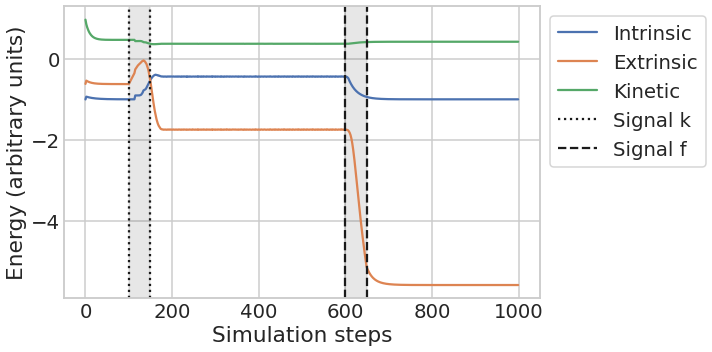

In [20]:
fig = plt.figure(figsize=(10,5))

separated_trials = pd.concat([all_output.iloc[0:total_time] for i in range(n_trials)], axis=1)
# separated_internal = [internal_potential_list[0:total_time] for i in range(n_trials)]
# separated_external = [external_potential_list[0:total_time] for i in range(n_trials)]

# at1 = separated_trials['at1'].mean(axis=1)
# at2 = separated_trials['at2'].mean(axis=1)
epithelium = separated_trials['early epithelium'].mean(axis=1)
internal = np.mean(internal_potential_list, axis=0)
external = np.mean(external_potential_list, axis=0)
kinetic = np.mean(kinetic_list, axis=0)

factor = 10
# plt.plot(range(total_time), epithelium, label='Cell type 0')
plt.plot(range(total_time), internal, label='Intrinsic')
plt.plot(range(total_time), factor*external, label='Extrinsic')
# plt.plot(range(total_time), internal - factor*external, label='Sum')
# plt.plot(range(total_time), internal + kinetic, label='Internal + Kinetic')
# plt.plot(range(total_time), factor*external + kinetic, label='External + Kinetic')
plt.plot(range(total_time), kinetic/N, label='Kinetic')

plt.axvline(x=simulation_args['signal_bounds']['start']['k'], label='Signal k', color='k', linestyle=':')
plt.axvline(x=simulation_args['signal_bounds']['end']['k'], color='k', linestyle=':')
plt.axvspan(simulation_args['signal_bounds']['start']['k'], simulation_args['signal_bounds']['end']['k'], alpha=0.1, color='k')

plt.axvline(x=simulation_args['signal_bounds']['start']['f'], label='Signal f', color='k', linestyle='--')
plt.axvline(x=simulation_args['signal_bounds']['end']['f'], color='k', linestyle='--')
plt.axvspan(simulation_args['signal_bounds']['start']['f'], simulation_args['signal_bounds']['end']['f'], alpha=0.1, color='k')

plt.legend(bbox_to_anchor=(1,1), loc="upper left",)


# plt.ylim([-0.05, 1.05])

plt.xlabel('Simulation steps')
plt.ylabel('Energy (arbitrary units)')


plt.tight_layout()

# plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/energy update (with kinetic).pdf", bbox_inches = "tight")
plt.show()

/scratch/260159.1.ood/ipykernel_2091533/1180461549.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(scalarmap, label=label, **kwargs)


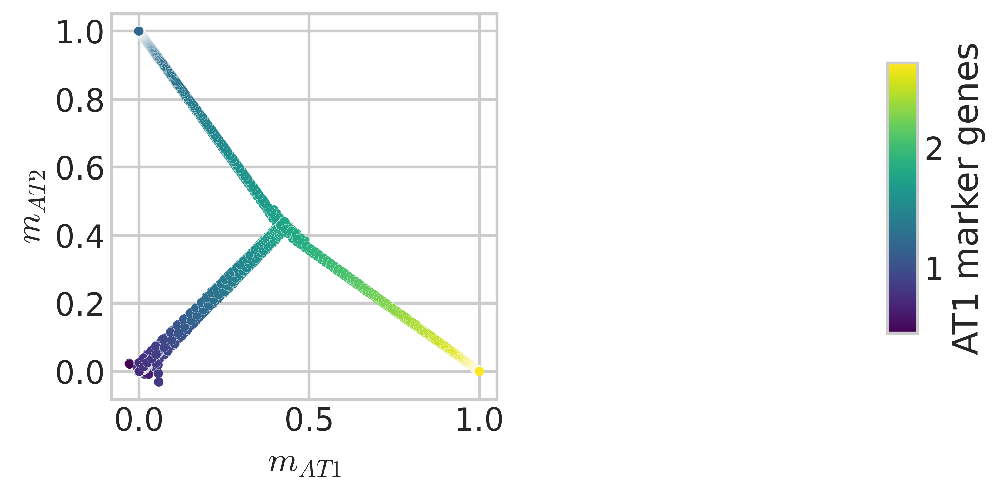

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
axes_list = axes.flatten()

hue_data = signature

hue_norm = (min(hue_data), max(hue_data))

ax = axes_list[0]

sns.scatterplot(x=all_output['at1'],
                y=all_output['at2'],
                hue = hue_data,
                legend=False,
                palette='viridis',
                linewidth=0.1,
                s = 25,
                hue_norm = hue_norm,
                ax=ax
               )

ax.set_ylabel('$m_{AT2}$')
ax.set_xlabel('$m_{AT1}$')
ax.set_aspect('equal')
plt.xlim([-0.1, 0.55])
plt.ylim([-0.15, 0.4])
    
    
plt.tight_layout()

ax = axes_list[-1]
cmap = create_colorbar(hue_norm, 'AT1 marker genes',
                           colormap='viridis', cax = ax)

bbox=ax.get_position()
ax.set_position([bbox.x0-0.05, bbox.y0+0.12, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.7], which='both')
ax.set_aspect(4)

# plt.savefig("./figs/progenitor potential.png", bbox_inches = "tight")
plt.show()

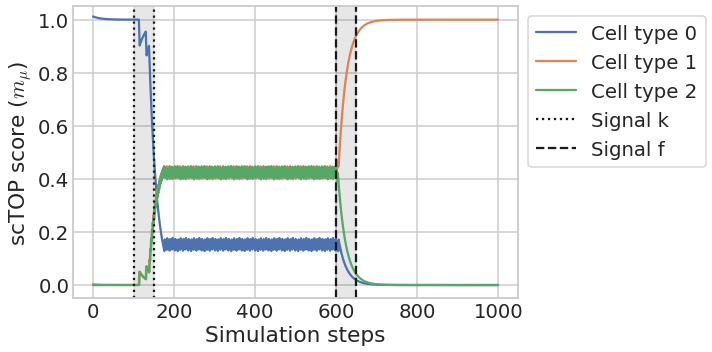

In [14]:
fig = plt.figure(figsize=(10,5))

separated_trials = pd.concat([all_output.iloc[0:total_time] for i in range(n_trials)], axis=1)

at1 = separated_trials['at1'].mean(axis=1)
at2 = separated_trials['at2'].mean(axis=1)
epithelium = separated_trials['early epithelium'].mean(axis=1)

plt.plot(range(total_time), epithelium, label='Cell type 0')
plt.plot(range(total_time), at1, label='Cell type 1')
plt.plot(range(total_time), at2, label='Cell type 2')

plt.axvline(x=simulation_args['signal_bounds']['start']['k'], label='Signal k', color='k', linestyle=':')
plt.axvline(x=simulation_args['signal_bounds']['end']['k'], color='k', linestyle=':')
plt.axvspan(simulation_args['signal_bounds']['start']['k'], simulation_args['signal_bounds']['end']['k'], alpha=0.1, color='k')

plt.axvline(x=simulation_args['signal_bounds']['start']['f'], label='Signal f', color='k', linestyle='--')
plt.axvline(x=simulation_args['signal_bounds']['end']['f'], color='k', linestyle='--')
plt.axvspan(simulation_args['signal_bounds']['start']['f'], simulation_args['signal_bounds']['end']['f'], alpha=0.1, color='k')

plt.legend(bbox_to_anchor=(1,1), loc="upper left",)


plt.ylim([-0.05, 1.05])

plt.xlabel('Simulation steps')
plt.ylabel('scTOP score ($m_{\mu}$)')


plt.tight_layout()

plt.show()

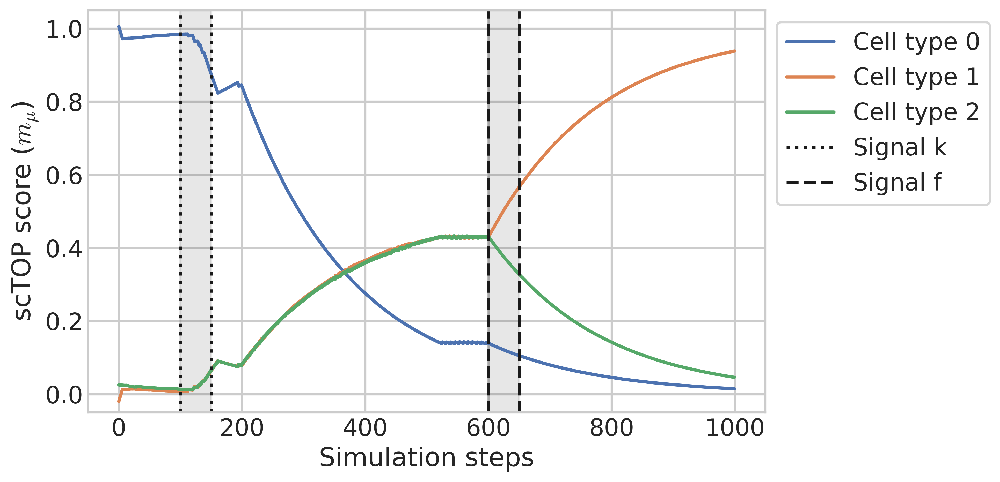

In [87]:
fig = plt.figure(figsize=(10,5))

separated_trials = pd.concat([all_output.iloc[0:total_time] for i in range(n_trials)], axis=1)

at1 = separated_trials['at1'].mean(axis=1)
at2 = separated_trials['at2'].mean(axis=1)
epithelium = separated_trials['early epithelium'].mean(axis=1)

plt.plot(range(total_time), epithelium, label='Cell type 0')
plt.plot(range(total_time), at1, label='Cell type 1')
plt.plot(range(total_time), at2, label='Cell type 2')

plt.axvline(x=simulation_args['signal_bounds']['start']['k'], label='Signal k', color='k', linestyle=':')
plt.axvline(x=simulation_args['signal_bounds']['end']['k'], color='k', linestyle=':')
plt.axvspan(simulation_args['signal_bounds']['start']['k'], simulation_args['signal_bounds']['end']['k'], alpha=0.1, color='k')

plt.axvline(x=simulation_args['signal_bounds']['start']['f'], label='Signal f', color='k', linestyle='--')
plt.axvline(x=simulation_args['signal_bounds']['end']['f'], color='k', linestyle='--')
plt.axvspan(simulation_args['signal_bounds']['start']['f'], simulation_args['signal_bounds']['end']['f'], alpha=0.1, color='k')

plt.legend(bbox_to_anchor=(1,1), loc="upper left",)


plt.ylim([-0.05, 1.05])

plt.xlabel('Simulation steps')
plt.ylabel('scTOP score ($m_{\mu}$)')


plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 1 in 9 update (avg over 10 trials).png", bbox_inches = "tight")
plt.show()

/scratch/282988.1.ood/ipykernel_1571928/4206457691.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


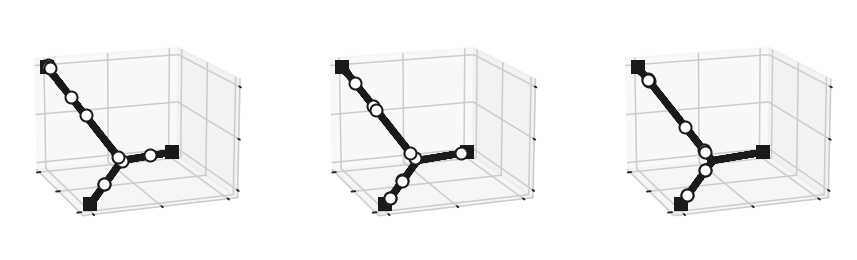

In [10]:
# Without noise

time_points = [0, 220, 400]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

# plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp fig 2.png", bbox_inches = "tight")
plt.show()

In [82]:
sns.set(context='talk', color_codes=True, palette='deep', style='whitegrid',
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'axes.linewidth': 1.5, 'figure.dpi':400, 'text.usetex':False}) #font_scale=0.3,

In [15]:
all_output

,at1,at2,early epithelium
0,0.025576,-0.028647,0.316565
1,-0.001936,0.012726,0.282960
2,-0.000902,0.026782,0.279141
3,-0.006534,-0.025869,0.320351
4,-0.021662,0.026842,0.298886
...,...,...,...
995,0.285114,0.023071,-0.010570
996,0.238549,0.055945,-0.000838
997,0.248050,0.028654,0.035467
998,0.294470,0.004078,0.028150


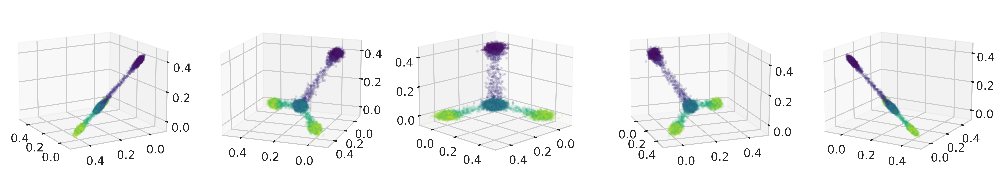

In [38]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.1, c=all_output.index, s = 7, cmap='viridis')

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 3d noise.png", bbox_inches = "tight")

plt.show()

In [11]:
from itertools import combinations

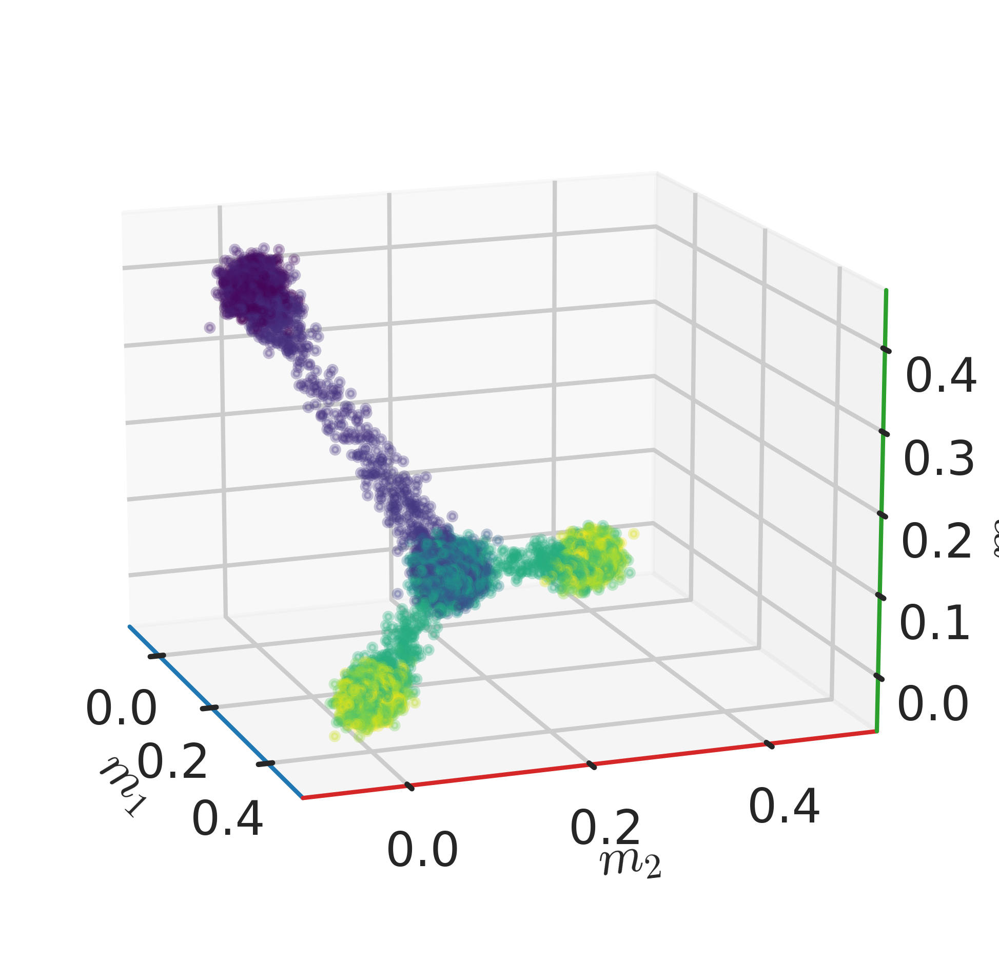

In [45]:
fig = plt.figure(figsize=(25,5))

view = [15, -20]
ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.3, c=all_output.index, s = 7, cmap='viridis')
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$')
ax.set_ylabel('$m_2$')
ax.set_zlabel('$m_0$')

ax.xaxis.line.set_color('tab:blue')
ax.yaxis.line.set_color('tab:red')
ax.zaxis.line.set_color('tab:green')

plt.tight_layout()
    
plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 3d.png", bbox_inches = "tight")

plt.show()

In [10]:
label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

color_dict = {'at1': 'tab:blue',
              'at2': 'tab:red',
              'early epithelium': 'tab:green'
             }

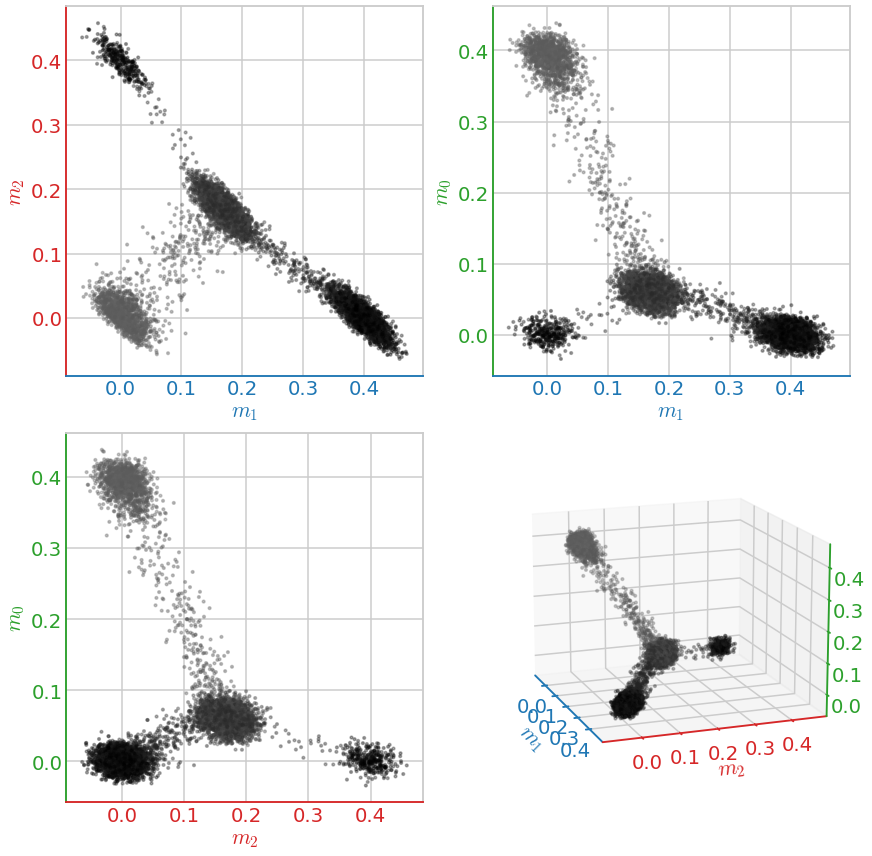

In [13]:
fig = plt.figure(figsize=(12,12))

# views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
# num_views = len(views)

from matplotlib.colors import LinearSegmentedColormap

colors = [(0.4, 0.4, 0.4), (0, 0, 0)]  # Gray to Black in RGB

cmap = LinearSegmentedColormap.from_list('gray_to_black', colors)

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)


    ax.scatter(all_output[pair[0]], all_output[pair[1]],
               alpha=0.35, c=all_output.index, s = 7, cmap=cmap)
    
    ax.spines['bottom'].set_color(color_dict[pair[0]])  # X-axis (bottom spine)
    ax.spines['left'].set_color(color_dict[pair[1]])   # Y-axis (left spine)

    # Set the tick color for each axis
    ax.xaxis.set_tick_params(colors=color_dict[pair[0]])  # X-axis ticks
    ax.yaxis.set_tick_params(colors=color_dict[pair[1]]) # Y-axis ticks

    # Set the label color for each axis
    ax.xaxis.label.set_color(color_dict[pair[0]])
    ax.yaxis.label.set_color(color_dict[pair[1]])
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
    
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.3, c=all_output.index, s = 7, cmap=cmap)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)

ax.xaxis.line.set_color('tab:blue')
ax.yaxis.line.set_color('tab:red')
ax.zaxis.line.set_color('tab:green')   

ax.xaxis.set_tick_params(colors='tab:blue')
ax.yaxis.set_tick_params(colors='tab:red')
ax.zaxis.set_tick_params(colors=color_dict[pair[1]])

ax.xaxis.label.set_color('tab:blue')
ax.yaxis.label.set_color('tab:red')
ax.zaxis.label.set_color('tab:green')

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp projections.pdf", bbox_inches = "tight")
    
plt.show()

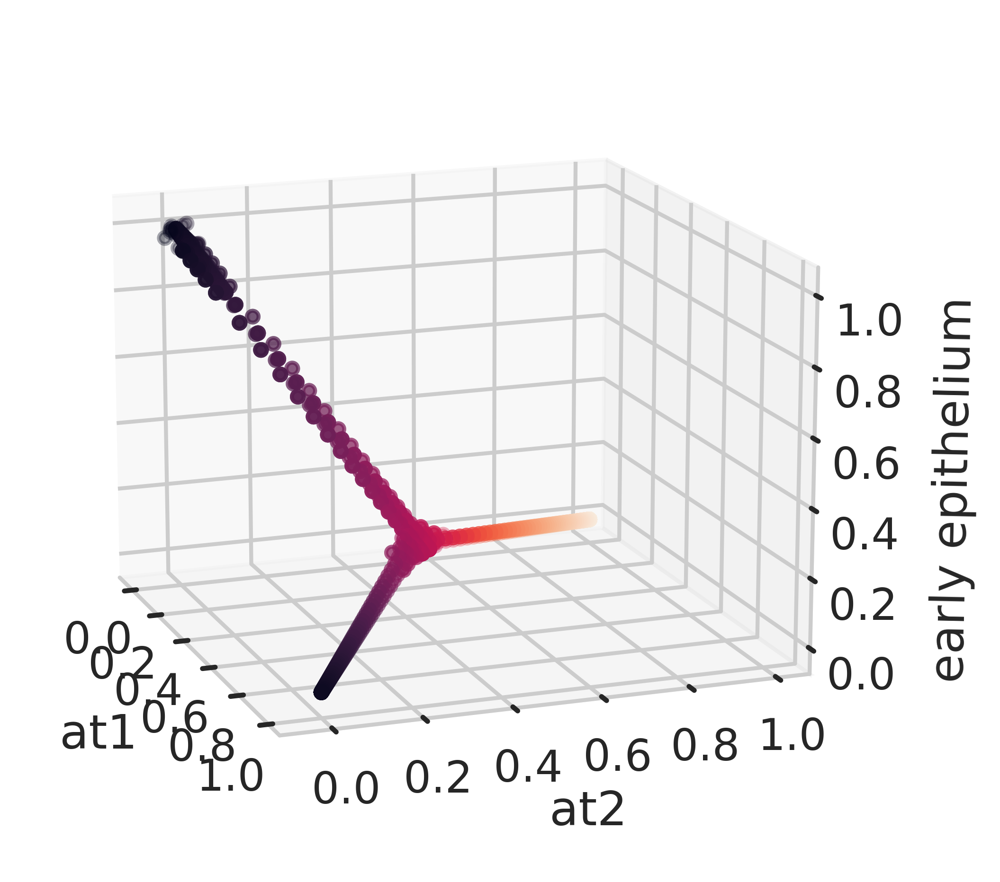

In [89]:
# Without noise

fig = plt.figure(figsize=(25,5))

ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.35, c=all_output['at2'])

ax.set_xlabel('at1', labelpad=10)
ax.set_ylabel('at2', labelpad=10)
ax.set_zlabel('early epithelium', labelpad=10)

ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 3d noiseless.png", bbox_inches = "tight")
plt.show()

In [41]:
def simulate_rhos(rho_delta, rho_p):
    n_trials = 2
    output_list = []
    rng = np.random.default_rng()

    total_time = 750

    landscape_args = {'start_params': {'f': 0, 'k': 0},
                  'attractor_coords': [[0, triple_cusp_coords['y0']], [triple_cusp_coords['x1'], triple_cusp_coords['y1']]],
                  'gradients': triple_cusp_grad,
                 }

    dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [rho_delta, rho_p]
                }

    for trial in trange(n_trials):
        # generate new initial coordinates for each trial
        dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

        attractor_network = AttractorNetwork(dynamics_args, landscape_args)

        simulation_args = {'total_time': total_time,
                            'signal_bounds': {'start': {'f': 300, 'k': 100},
                                              'end':   {'f': 400, 'k': 200}},
                            'finish_params': {'f': 0.3, 'k': 0.3},
                            'recorded_genes': ['Sftpc', *AT1_signature],
        #                         'add_noise': True
                            }

        output = attractor_network.simulate(**simulation_args)
        
        output_list += [output.iloc[:, :3]]

    all_output = pd.concat(output_list, axis=0)
    return all_output, attractor_network

0it [00:00, ?it/s]
100%|██████████| 2/2 [00:04<00:00,  2.41s/it]
1it [00:04,  4.83s/it]
100%|██████████| 2/2 [00:04<00:00,  2.41s/it]
2it [00:09,  4.84s/it]
100%|██████████| 2/2 [00:04<00:00,  2.40s/it]
3it [00:14,  4.83s/it]


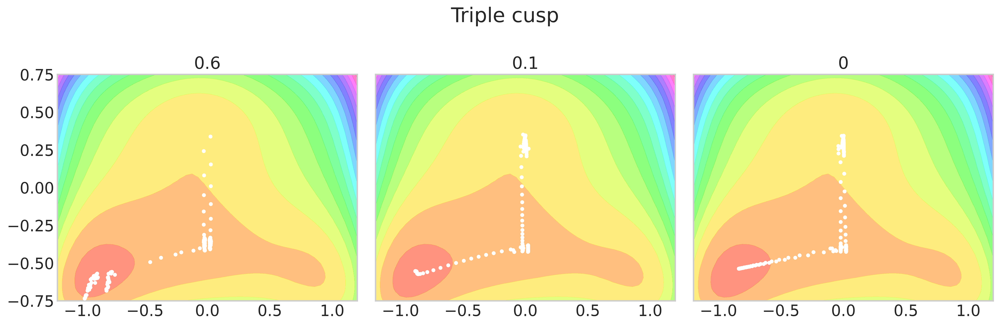

In [49]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**6 - x**4 + x**2 + 4*y**4 - y**2 + 2*(x**2)*y + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 6*x**5 - 4*x**3 + 2*x + 4*x*y + f
    grad_y = 16*y**3 - 2*y +2*x**2 + k
    return -grad_x, -grad_y

fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(15,5))
axes_list = axes.flatten()

rho_deltas = [0.6, 0.1, 0]

for rho_delt, ax in tqdm(zip(rho_deltas, axes_list)):
    output, attractor_network = simulate_rhos(rho_delt, 10)

    ylims = 0.75
    time = 500

    x = np.linspace(-1.2, 1.2, 50)
    y = np.linspace(-ylims, ylims, 50)
    X, Y = np.meshgrid(x, y)
    f, k = 0.3, 0.3

    Z = potential_function(X, Y, f, k)

    ax.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
#     ax.colorbar()

#     x = np.linspace(-1.2, 1.2, 20)
#     y = np.linspace(-ylims, ylims, 20)
#     X, Y = np.meshgrid(x, y)

#     U, V = potential_grad(X, Y, f, k)
#     speed = np.sqrt(U**2 + V**2)

#     ax.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
#                scale_units="inches", scale=20, width=0.009, pivot="mid")

    df = output[['at1', 'at2', 'early epithelium']].T

    ones_row = pd.DataFrame(np.ones((output.shape[0]))).T
    ones_row.columns = df.columns
    df = pd.concat([df, ones_row], axis=0)

    X = np.dot(attractor_network.hx, df)
    Y = np.dot(attractor_network.hy, df)

    ax.scatter(x=X[::4], y=Y[::4], 
                    s=10, color='white', zorder=3, linewidth=1)

#     ax.scatter(x=X[::time], y=Y[::time], 
#                     s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

    ax.grid(False)
    ax.set_title(rho_delt)

# plt.xlabel('X')
# plt.ylabel('Y')
plt.suptitle('Triple cusp')
plt.tight_layout()

plt.show()

# intrinsic landscape

In [19]:
X.flatten().reshape((50,50))

array([[-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ],
       [-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ],
       [-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ],
       ...,
       [-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ],
       [-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ],
       [-1.2       , -1.15102041, -1.10204082, ...,  1.10204082,
         1.15102041,  1.2       ]])

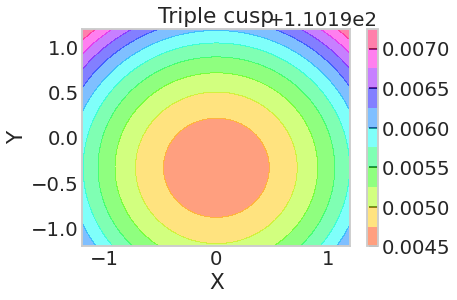

In [24]:
# plot intrinsic landscape

x_to_m = generate_x_to_m_matrix(1, 1, -1)

def intrinsic_potential(x, y, temp):
    x_vector = np.array([x.flatten(), y.flatten(), 
                         np.zeros_like(x.flatten()), np.ones_like(x.flatten())])
    
    m = np.dot(x_to_m, x_vector)
    m = m[:-1]
#     m = m.reshape(3, 50, 50) # is this legit?
    
    state = attractor_states.dot(m)    
    first_term = (1/(2*N))*(state.multiply(state)).sum(axis=0)
    
    second_term = temp*np.log(np.sum(np.exp(m/temp), axis=0))
#     internal_potential = (first_term - second_term).values
    internal_potential = second_term

    internal_potential = internal_potential.reshape((50,50))
    
    return internal_potential

ylims = 1.2
time = 500

x = np.linspace(-1.2, 1.2, 50)
y = np.linspace(-ylims, ylims, 50)
X, Y = np.meshgrid(x, y)
f, k = 0, 0

Z = intrinsic_potential(X, Y, 100)

plt.contourf(X, Y, Z, cmap="hsv", levels=10, alpha=0.5)
plt.colorbar()

x = np.linspace(-1.2, 1.2, 20)
y = np.linspace(-ylims, ylims, 20)
X, Y = np.meshgrid(x, y)

# U, V = potential_grad(X, Y, f, k)
# speed = np.sqrt(U**2 + V**2)

# plt.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
#            scale_units="inches", scale=20, width=0.009, pivot="mid")

# df = all_output[['at1', 'at2', 'early epithelium']].T

# ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
# ones_row.columns = df.columns
# df = pd.concat([df, ones_row], axis=0)

# X = np.dot(attractor_network.hx, df)
# Y = np.dot(attractor_network.hy, df)

# plt.scatter(x=X[::4], y=Y[::4], 
#                 s=10, color='white', zorder=3, linewidth=1)

# plt.scatter(x=X[::time], y=Y[::time], 
#                 s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

plt.grid(False)

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Triple cusp')

plt.show()

/scratch/245703.1.ood/ipykernel_1353962/2871769465.py:22: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


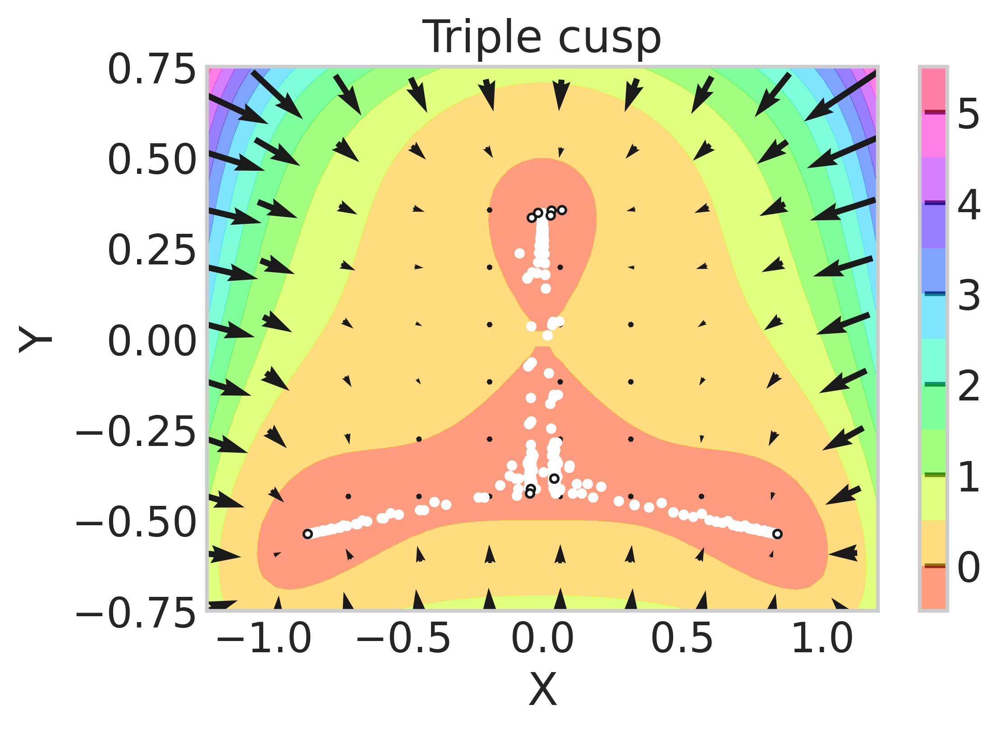

In [15]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**6 - x**4 + x**2 + 4*y**4 - y**2 + 2*(x**2)*y + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 6*x**5 - 4*x**3 + 2*x + 4*x*y + f
    grad_y = 16*y**3 - 2*y +2*x**2 + k
    return -grad_x, -grad_y

ylims = 0.75
time = 500

x = np.linspace(-1.2, 1.2, 50)
y = np.linspace(-ylims, ylims, 50)
X, Y = np.meshgrid(x, y)
f, k = 0, 0

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=10, alpha=0.5)
plt.colorbar()

x = np.linspace(-1.2, 1.2, 20)
y = np.linspace(-ylims, ylims, 20)
X, Y = np.meshgrid(x, y)

U, V = potential_grad(X, Y, f, k)
speed = np.sqrt(U**2 + V**2)

plt.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
           scale_units="inches", scale=20, width=0.009, pivot="mid")

df = all_output[['at1', 'at2', 'early epithelium']].T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)

plt.scatter(x=X[::time], y=Y[::time], 
                s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

plt.grid(False)

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Triple cusp')

plt.show()

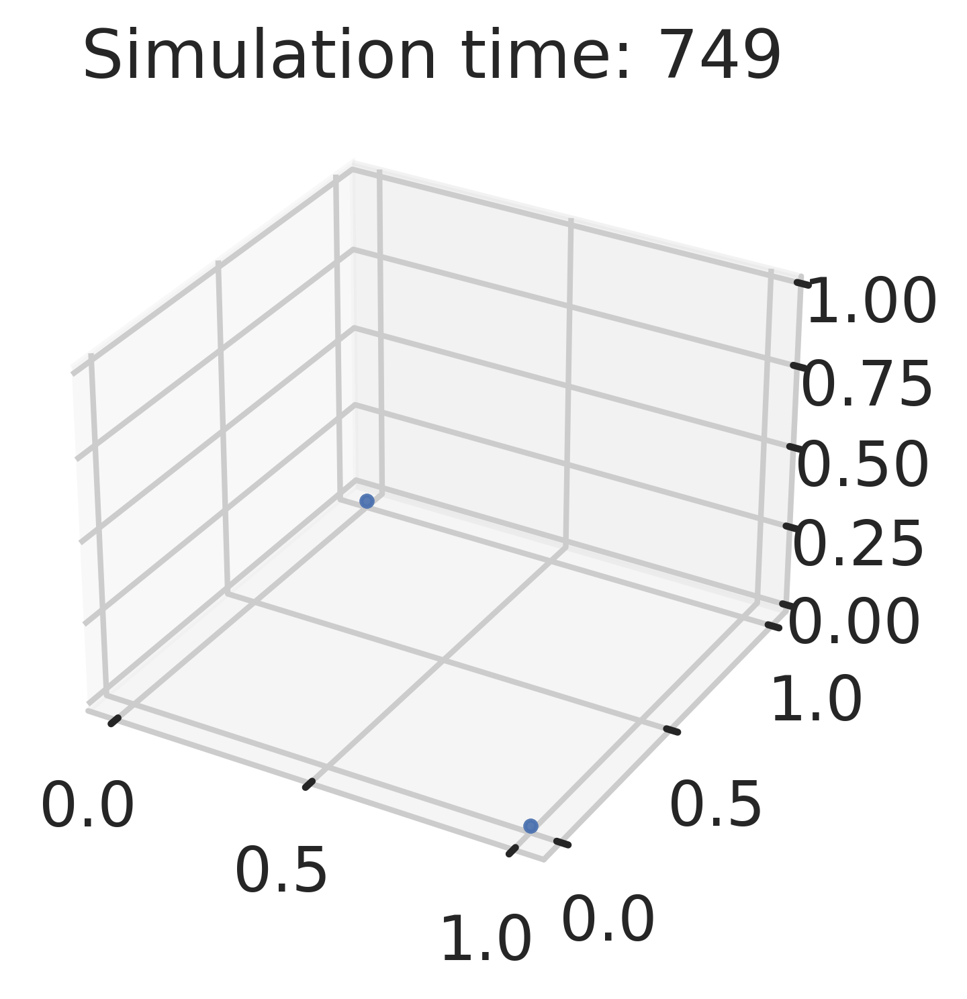

In [90]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
# bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
#     ax.set_xlim(bounds)
#     ax.set_ylim(bounds)
#     ax.set_zlim(bounds)
#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D triple cusp animation (without noise).gif", dpi=300, writer=PillowWriter(fps=30))

# Double cusp simulations

In [16]:
n_trials = 10
output_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 750

landscape_args = {'start_params': {'f': 0, 'k': 0.15},
                  'attractor_coords': [[0, double_cusp_coords['y0']], [double_cusp_coords['x1'], double_cusp_coords['y1']]],
                  'gradients': double_cusp_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
   
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 100, 'k': 100},
                                          'end':   {'f': 150, 'k': 150}},
                        'finish_params': {'f': rng.choice([-0.1, 0.1]), 'k': 0.15},
                        'recorded_genes': ['Sftpc', *AT1_signature],
                        'add_noise': True
                        }
    
    output = attractor_network.simulate(**simulation_args)
    AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    gene_list += [output[['Sftpc','Aqp5']]]
    signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
all_genes = pd.concat(gene_list, axis=0)
signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:30<00:00,  3.06s/it]


/scratch/248875.1.ood/ipykernel_4101279/1180461549.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(scalarmap, label=label, **kwargs)


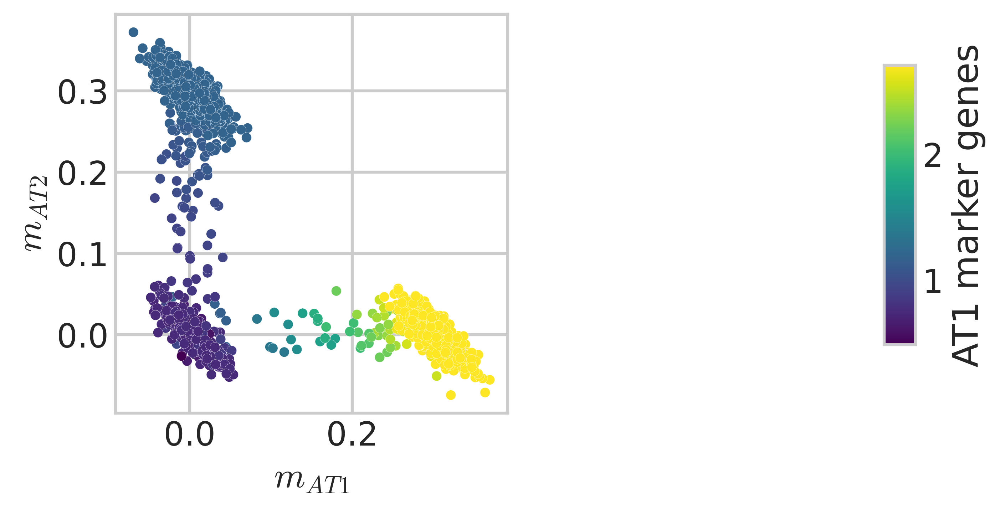

In [94]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
axes_list = axes.flatten()

hue_data = signature

hue_norm = (min(hue_data), max(hue_data))

ax = axes_list[0]

sns.scatterplot(x=all_output['at1'][::3],
                y=all_output['at2'][::3],
                hue = hue_data[::3],
                legend=False,
                palette='viridis',
                linewidth=0.1,
                s = 25,
                hue_norm = hue_norm,
                ax=ax
               )

ax.set_ylabel('$m_{AT2}$')
ax.set_xlabel('$m_{AT1}$')
ax.set_aspect('equal')
    
    
plt.tight_layout()

ax = axes_list[-1]
cmap = create_colorbar(hue_norm, 'AT1 marker genes',
                           colormap='viridis', cax = ax)

bbox=ax.get_position()
ax.set_position([bbox.x0-0.05, bbox.y0+0.12, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.7], which='both')
ax.set_aspect(4)

# plt.savefig("./figs/progenitor potential.png", bbox_inches = "tight")
plt.show()

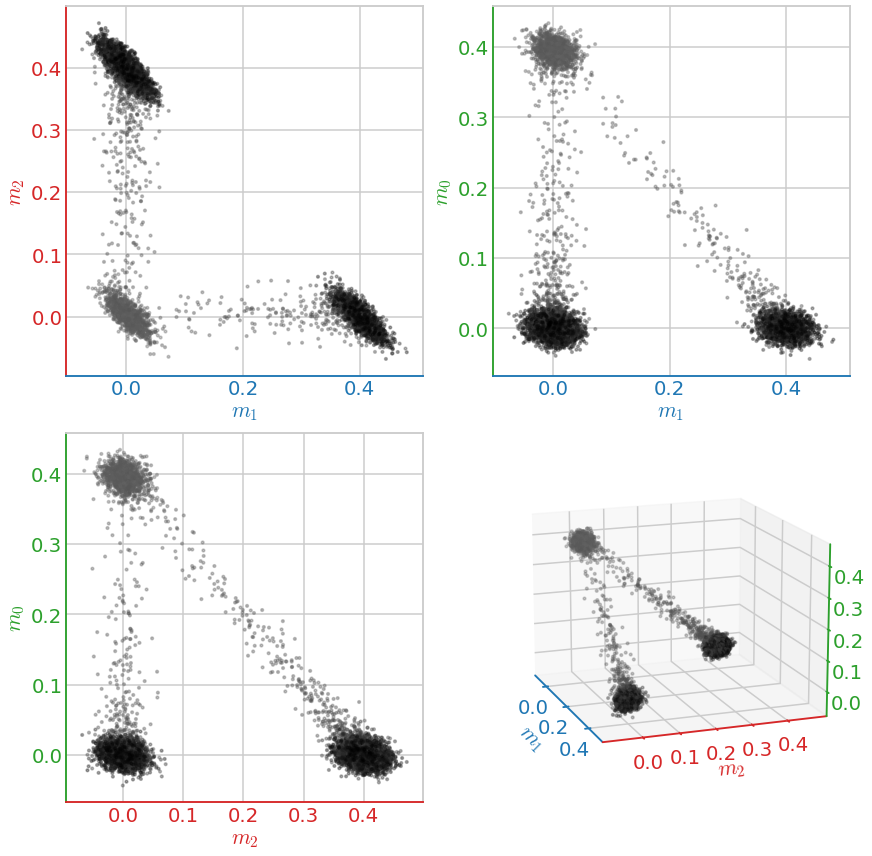

In [17]:
fig = plt.figure(figsize=(12,12))

# views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
# num_views = len(views)

from matplotlib.colors import LinearSegmentedColormap

colors = [(0.4, 0.4, 0.4), (0, 0, 0)]  # Gray to Black in RGB

cmap = LinearSegmentedColormap.from_list('gray_to_black', colors)

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)


    ax.scatter(all_output[pair[0]], all_output[pair[1]],
               alpha=0.35, c=all_output.index, s = 7, cmap=cmap)
    
    ax.spines['bottom'].set_color(color_dict[pair[0]])  # X-axis (bottom spine)
    ax.spines['left'].set_color(color_dict[pair[1]])   # Y-axis (left spine)

    # Set the tick color for each axis
    ax.xaxis.set_tick_params(colors=color_dict[pair[0]])  # X-axis ticks
    ax.yaxis.set_tick_params(colors=color_dict[pair[1]]) # Y-axis ticks

    # Set the label color for each axis
    ax.xaxis.label.set_color(color_dict[pair[0]])
    ax.yaxis.label.set_color(color_dict[pair[1]])
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
    
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.3, c=all_output.index, s = 7, cmap=cmap)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)

ax.xaxis.line.set_color('tab:blue')
ax.yaxis.line.set_color('tab:red')
ax.zaxis.line.set_color('tab:green')   

ax.xaxis.set_tick_params(colors='tab:blue')
ax.yaxis.set_tick_params(colors='tab:red')
ax.zaxis.set_tick_params(colors=color_dict[pair[1]])

ax.xaxis.label.set_color('tab:blue')
ax.yaxis.label.set_color('tab:red')
ax.zaxis.label.set_color('tab:green')

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp projections.pdf", bbox_inches = "tight")
    
plt.show()

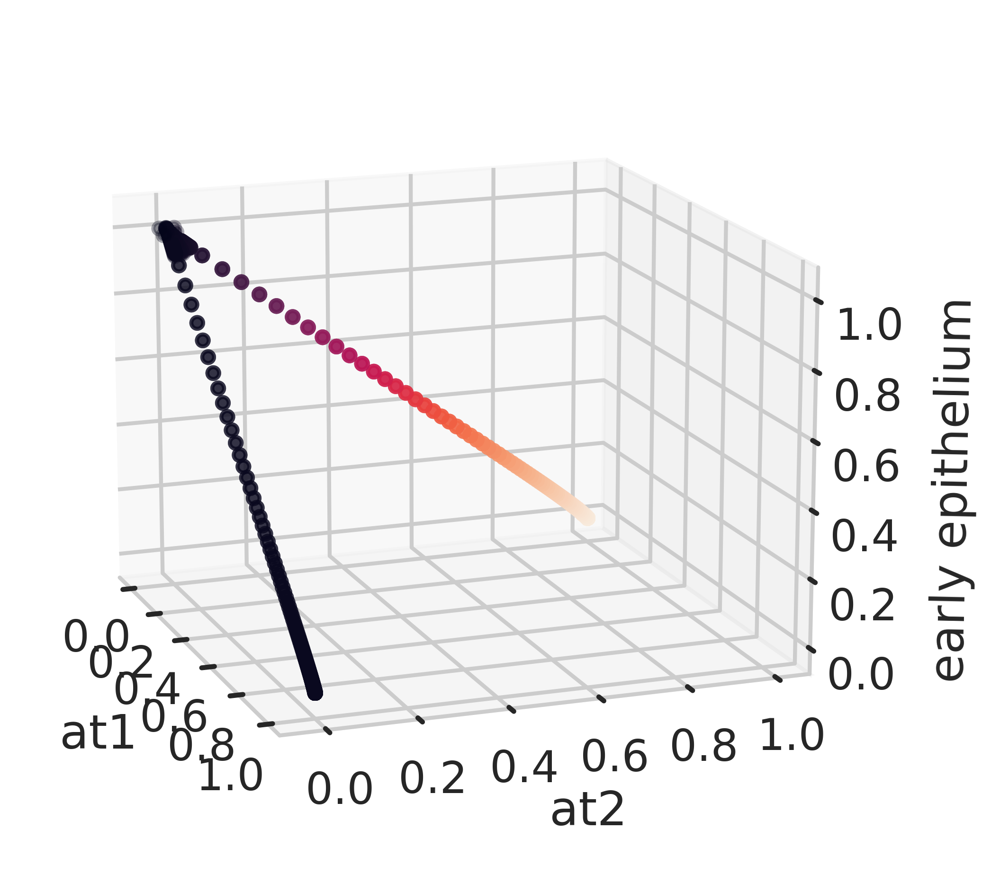

In [100]:
# Without noise

fig = plt.figure(figsize=(25,5))

ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.35, c=all_output['at2'])

ax.set_xlabel('at1', labelpad=10)
ax.set_ylabel('at2', labelpad=10)
ax.set_zlabel('early epithelium', labelpad=10)

ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp 3d noiseless.png", bbox_inches = "tight")
plt.show()

/scratch/250770.1.ood/ipykernel_439885/431014630.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


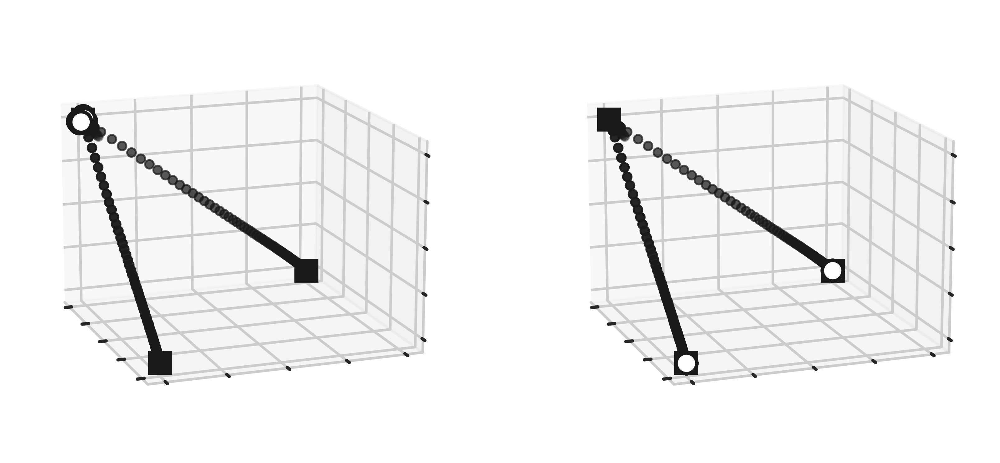

In [10]:
# Without noise

time_points = [0, 500]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp fig 2.png", bbox_inches = "tight")
plt.show()

In [ ]:
# Without noise

time_points = [0, 140, 500]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp fig 2.png", bbox_inches = "tight")
plt.show()

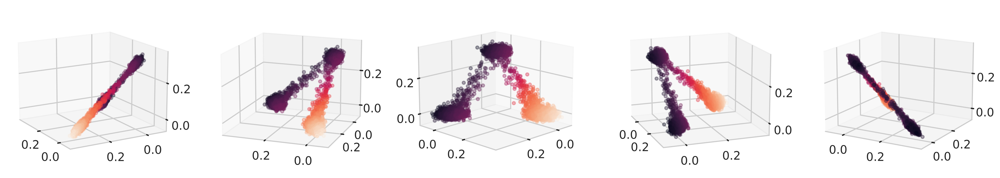

In [96]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.35, c=all_output['at2'])

#     ax.set_xlabel('at1', labelpad=10)
#     ax.set_ylabel('at2', labelpad=10)
#     ax.set_zlabel('early epithelium', labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp 3d noise.png", bbox_inches = "tight")

plt.show()

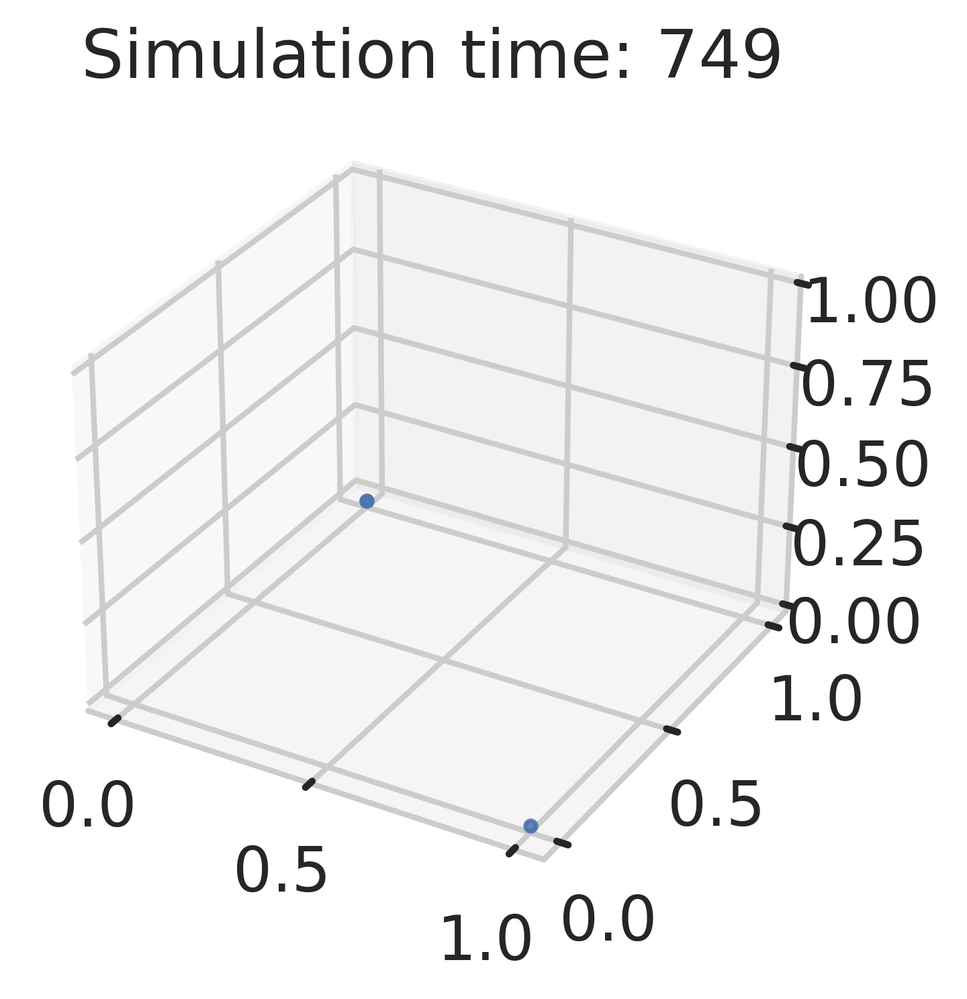

In [101]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
#     ax.set_xlim(bounds)
#     ax.set_ylim(bounds)
#     ax.set_zlim(bounds)

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D double cusp animation (without noise).gif", dpi=300, writer=PillowWriter(fps=30))

/scratch/247049.1.ood/ipykernel_261368/1681958240.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


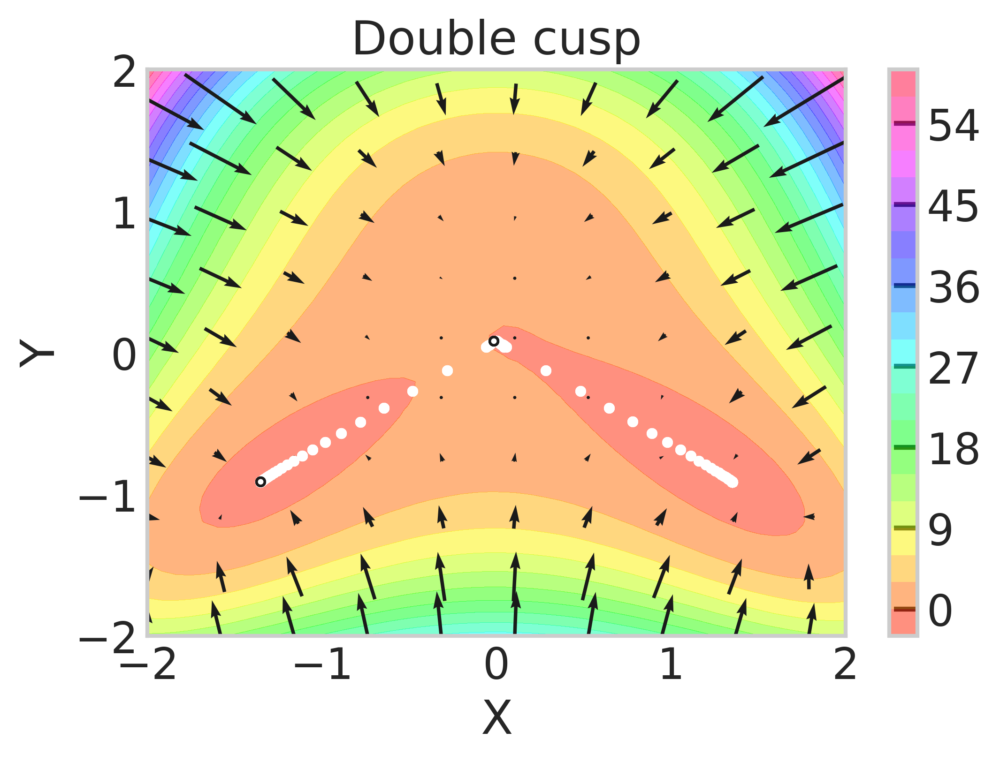

In [90]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 4*y*x**2 + y**2 + f*x - k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 8*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 4*x**2 + 2*y - k
    return -grad_x, -grad_y

time = 750

x = np.linspace(-2, 2, 50)
y = np.linspace(-2, 2, 50)
X, Y = np.meshgrid(x, y)
# plt.figure(figsize=(8, 8))

f, k = -0.1, 0.15

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
plt.colorbar()

x = np.linspace(-2, 2, 20)
y = np.linspace(-2, 2, 20)
X, Y = np.meshgrid(x, y)

U, V = potential_grad(X, Y, f, k)
speed = np.sqrt(U**2 + V**2)

# plt.quiver(X, Y, U, V, color='grey')
# lw = 5*speed / speed.max()
# plt.streamplot(X, Y, U, V, color = 'grey', density=1, linewidth=lw)

plt.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
           scale_units="inches", scale=100, width=0.005, pivot="mid")

# plt.scatter(x = [attractor_network.x0, attractor_network.x1, -attractor_network.x1],
#             y= [attractor_network.y0, attractor_network.y1, attractor_network.y1],
#             s=200, facecolors='none', edgecolors='k'
# )
# sns.scatterplot(x=attractor_network.h12.dot(output[['a0', 'a1', 'a2']].T), y=attractor_network.h0.dot(output[['a0', 'a1', 'a2']].T) + attractor_network.y1, 
#     hue=time_array, edgecolor=None)


df = all_output.T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)


# sns.scatterplot(x=X[::3], y=Y[::3], hue=np.tile(time_array, n_trials)[::3], 
#                 s=10, palette = 'mako_r', legend=False, zorder=2)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)

plt.scatter(x=X[::time], y=Y[::time], 
                s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

plt.grid(False)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Double cusp')

# Show the plot
# plt.colorbar(label='Potential (V)')
plt.show()

# Heteroclinic flip simulations

In [18]:
n_trials = 10
output_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 750

landscape_args = {'start_params': {'f': 0, 'k': 0.5},
                  'attractor_coords': [[0, het_flip_coords['y0']], [het_flip_coords['x1'], het_flip_coords['y1']]],
                  'gradients': het_flip_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0.0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
   
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 140, 'k': 100},
                                          'end':   {'f': 160, 'k': 150}},
                        'finish_params': {'f': rng.choice([-0.5, 0.5]), 'k': 2},
                        'recorded_genes': ['Sftpc', *AT1_signature],
                        'add_noise': True
                        }
    
    output = attractor_network.simulate(**simulation_args)
    AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    gene_list += [output[['Sftpc','Aqp5']]]
    signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
all_genes = pd.concat(gene_list, axis=0)
signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:30<00:00,  3.07s/it]


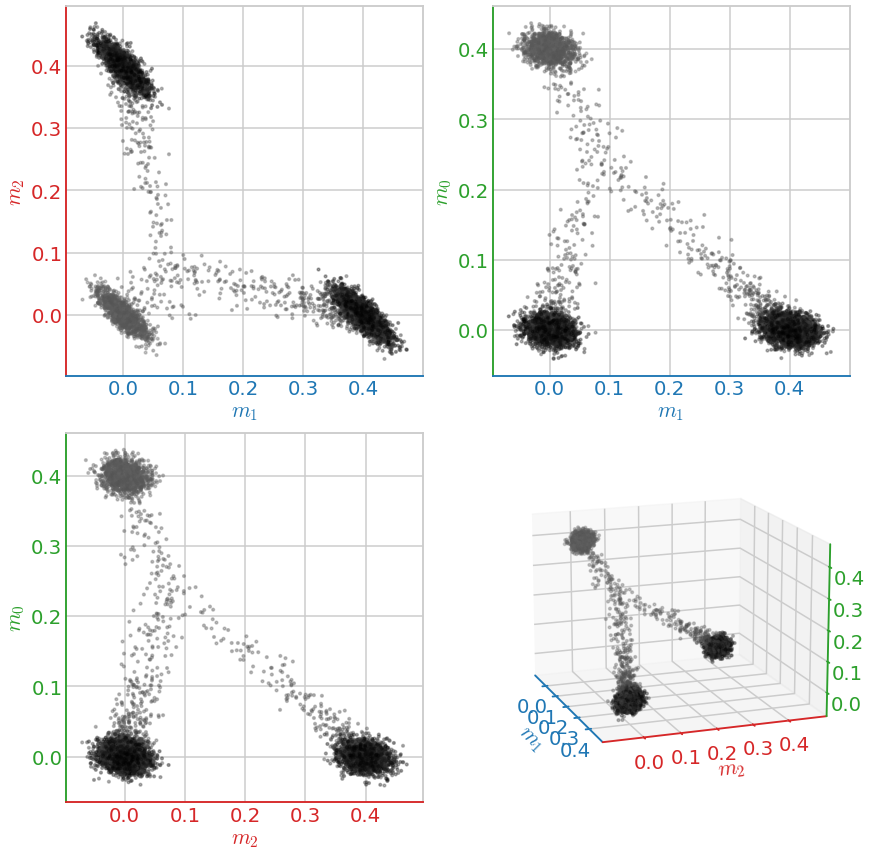

In [19]:
fig = plt.figure(figsize=(12,12))

# views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
# num_views = len(views)

from matplotlib.colors import LinearSegmentedColormap

colors = [(0.4, 0.4, 0.4), (0, 0, 0)]  # Gray to Black in RGB

cmap = LinearSegmentedColormap.from_list('gray_to_black', colors)

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)


    ax.scatter(all_output[pair[0]], all_output[pair[1]],
               alpha=0.35, c=all_output.index, s = 7, cmap=cmap)
    
    ax.spines['bottom'].set_color(color_dict[pair[0]])  # X-axis (bottom spine)
    ax.spines['left'].set_color(color_dict[pair[1]])   # Y-axis (left spine)

    # Set the tick color for each axis
    ax.xaxis.set_tick_params(colors=color_dict[pair[0]])  # X-axis ticks
    ax.yaxis.set_tick_params(colors=color_dict[pair[1]]) # Y-axis ticks

    # Set the label color for each axis
    ax.xaxis.label.set_color(color_dict[pair[0]])
    ax.yaxis.label.set_color(color_dict[pair[1]])
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
    
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.3, c=all_output.index, s = 7, cmap=cmap)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)

ax.xaxis.line.set_color('tab:blue')
ax.yaxis.line.set_color('tab:red')
ax.zaxis.line.set_color('tab:green')   

ax.xaxis.set_tick_params(colors='tab:blue')
ax.yaxis.set_tick_params(colors='tab:red')
ax.zaxis.set_tick_params(colors=color_dict[pair[1]])

ax.xaxis.label.set_color('tab:blue')
ax.yaxis.label.set_color('tab:red')
ax.zaxis.label.set_color('tab:green')

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip projections.pdf", bbox_inches = "tight")
    
plt.show()

/scratch/248875.1.ood/ipykernel_4101279/1180461549.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(scalarmap, label=label, **kwargs)


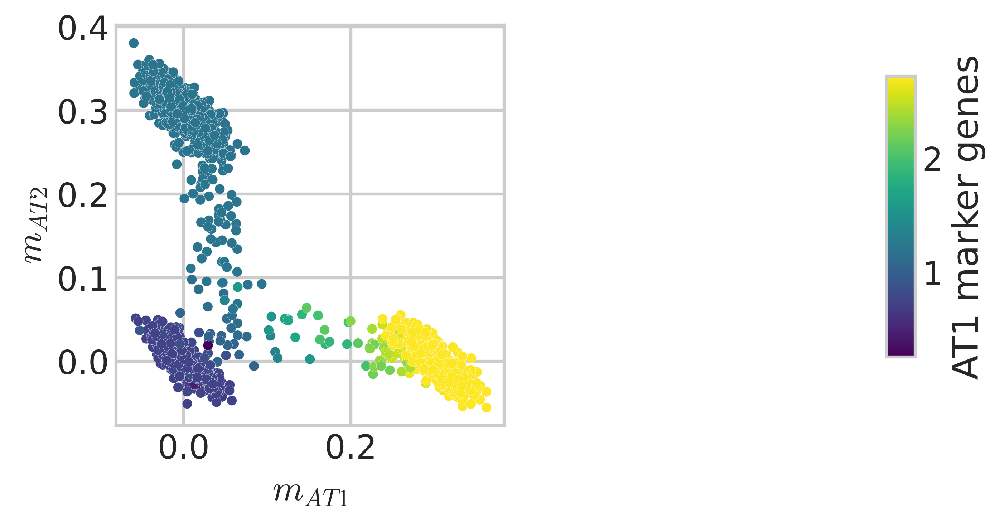

In [123]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
axes_list = axes.flatten()

hue_data = signature

hue_norm = (min(hue_data), max(hue_data))

ax = axes_list[0]

sns.scatterplot(x=all_output['at1'][::3],
                y=all_output['at2'][::3],
                hue = hue_data[::3],
                legend=False,
                palette='viridis',
                linewidth=0.1,
                s = 25,
                hue_norm = hue_norm,
                ax=ax
               )

ax.set_ylabel('$m_{AT2}$')
ax.set_xlabel('$m_{AT1}$')
ax.set_aspect('equal')
    
    
plt.tight_layout()

ax = axes_list[-1]
cmap = create_colorbar(hue_norm, 'AT1 marker genes',
                           colormap='viridis', cax = ax)

bbox=ax.get_position()
ax.set_position([bbox.x0-0.05, bbox.y0+0.12, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.7], which='both')
ax.set_aspect(4)

# plt.savefig("./figs/progenitor potential.png", bbox_inches = "tight")
plt.show()

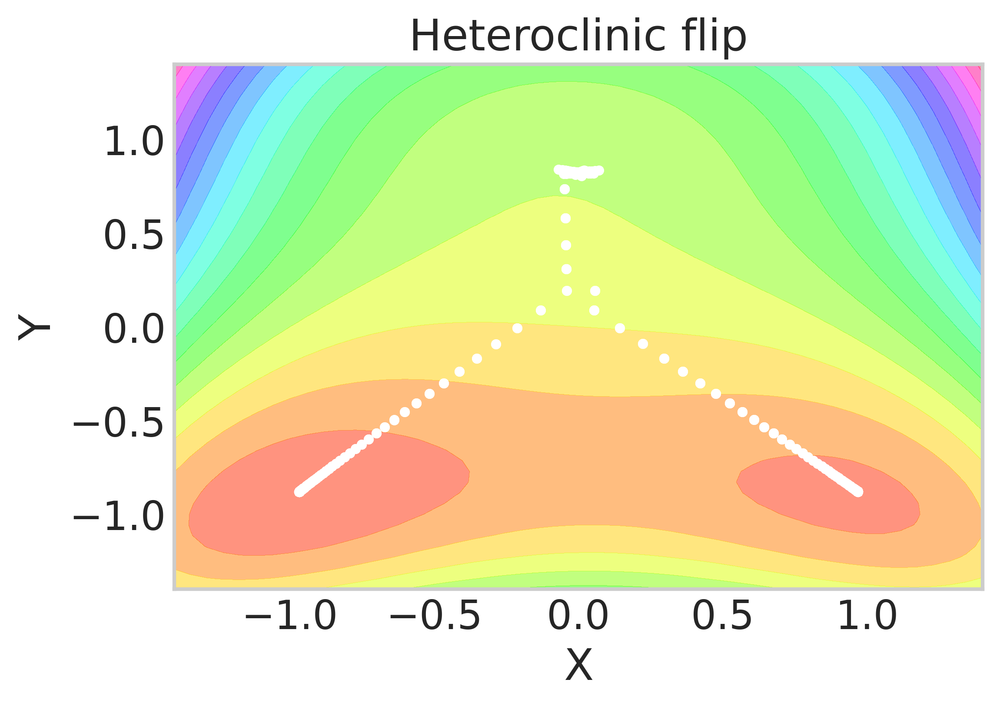

In [119]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

x = np.linspace(-1.4, 1.4, 50)
y = np.linspace(-1.4, 1.4, 50)
X, Y = np.meshgrid(x, y)
# plt.figure(figsize=(8, 8))

f, k = 0.2, 2

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)

df = all_output[['at1', 'at2', 'early epithelium']].T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)


plt.grid(False)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heteroclinic flip')

# Show the plot
# plt.colorbar(label='Potential (V)')
plt.show()

/scratch/249319.1.ood/ipykernel_3785488/1191066041.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


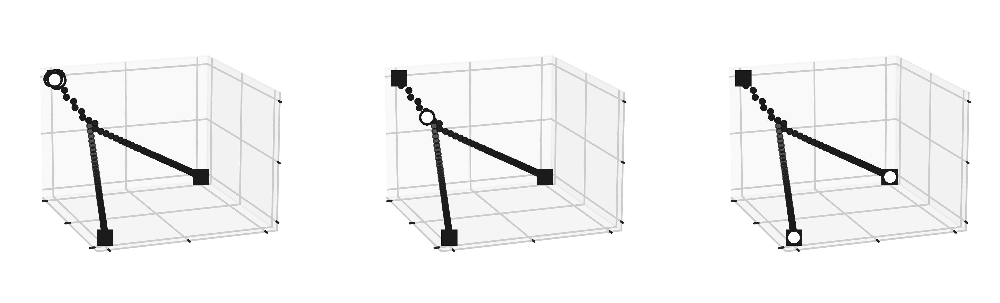

In [11]:
# Without noise

time_points = [0, 140, 500]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip fig 2.png", bbox_inches = "tight")
plt.show()

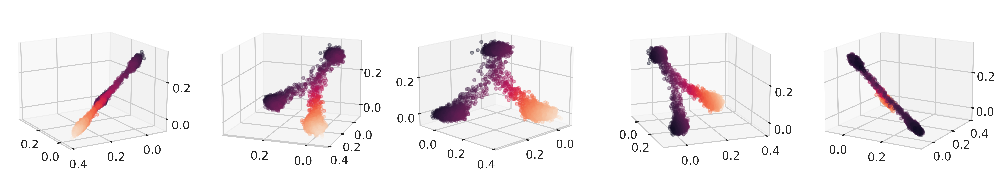

In [124]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.35, c=all_output['at2'])

#     ax.set_xlabel('at1', labelpad=10)
#     ax.set_ylabel('at2', labelpad=10)
#     ax.set_zlabel('early epithelium', labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip 3d noise.png", bbox_inches = "tight")

plt.show()

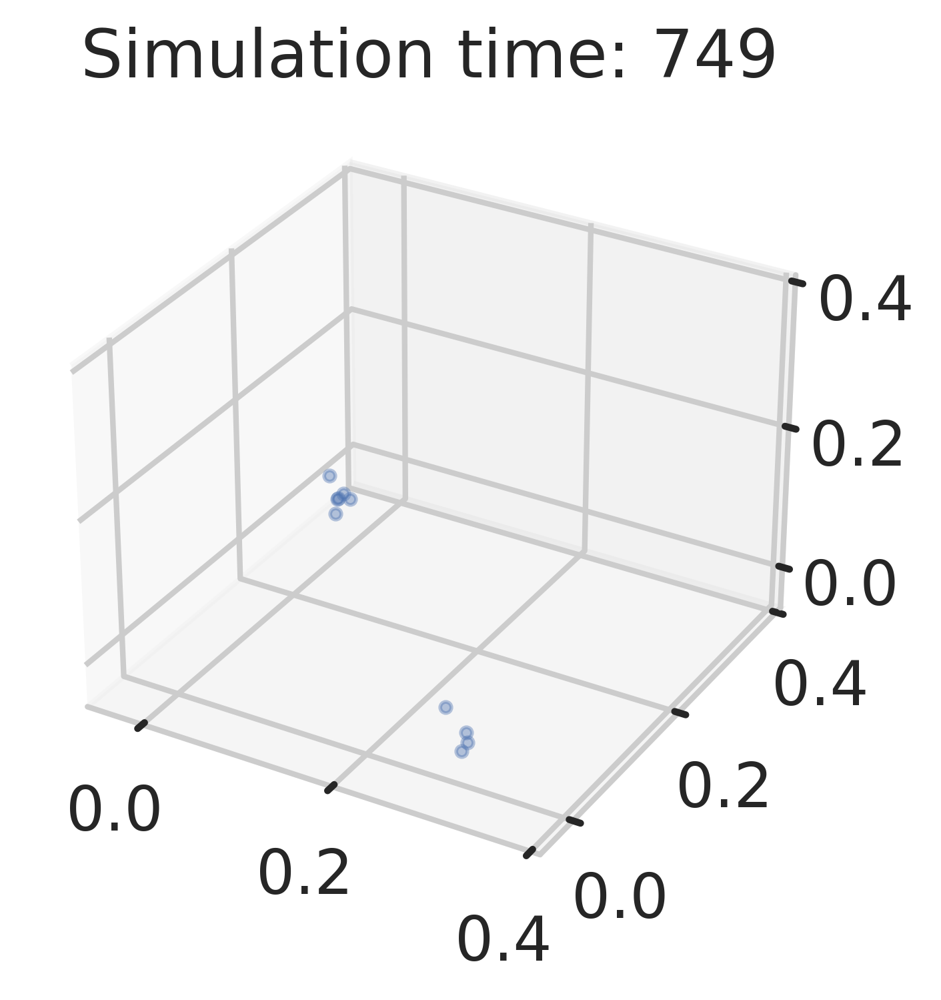

In [125]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D heteroclinic flip animation (with noise).gif",
         dpi=300, writer=PillowWriter(fps=30))

In [126]:
def simulate_rhos(rho_delta, rho_p):
    n_trials = 2
    output_list = []
    rng = np.random.default_rng()

    total_time = 750

    landscape_args = {'start_params': {'f': 0, 'k': 0.5},
                      'attractor_coords': [[0, het_flip_coords['y0']], [het_flip_coords['x1'], het_flip_coords['y1']]],
                      'gradients': het_flip_grad,
                     }

    dynamics_args = {'stored_states': attractor_states.T,
                     'rhos': [rho_delta, rho_p]
                    }

    for trial in trange(n_trials):
        # generate new initial coordinates for each trial
        dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

        attractor_network = AttractorNetwork(dynamics_args, landscape_args)

        simulation_args = {'total_time': total_time,
                            'signal_bounds': {'start': {'f': 100, 'k': 100},
                                              'end':   {'f': 150, 'k': 150}},
                            'finish_params': {'f': 0, 'k': 2},
                            'recorded_genes': ['Sftpc', *AT1_signature],
    #                         'add_noise': True
                            }

        output = attractor_network.simulate(**simulation_args)
        
        output_list += [output.iloc[:, :3]]

    all_output = pd.concat(output_list, axis=0)
    return all_output, attractor_network

0it [00:00, ?it/s]
100%|██████████| 2/2 [00:04<00:00,  2.34s/it]
1it [00:04,  4.71s/it]
100%|██████████| 2/2 [00:04<00:00,  2.32s/it]
2it [00:09,  4.68s/it]
100%|██████████| 2/2 [00:04<00:00,  2.34s/it]
3it [00:14,  4.69s/it]
100%|██████████| 2/2 [00:04<00:00,  2.35s/it]
4it [00:18,  4.70s/it]


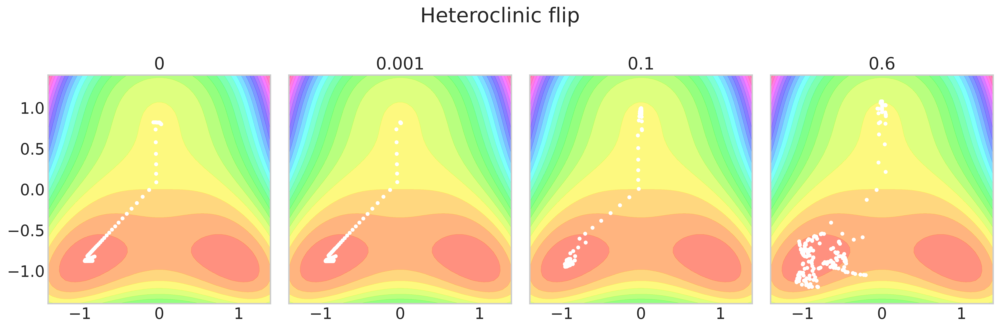

In [127]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

fig, axes = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(15,5))
axes_list = axes.flatten()

rho_deltas = [0, 0.001, 0.1, 0.6]

for rho_delt, ax in tqdm(zip(rho_deltas, axes_list)):
    output, attractor_network = simulate_rhos(rho_delt, 10)

    ylims = 1.4

    x = np.linspace(-1.4, 1.4, 50)
    y = np.linspace(-ylims, ylims, 50)
    X, Y = np.meshgrid(x, y)
    f, k = 0, 1.55

    Z = potential_function(X, Y, f, k)

    ax.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
    
    df = output[['at1', 'at2', 'early epithelium']].T

    ones_row = pd.DataFrame(np.ones((output.shape[0]))).T
    ones_row.columns = df.columns
    df = pd.concat([df, ones_row], axis=0)

    X = np.dot(attractor_network.hx, df)
    Y = np.dot(attractor_network.hy, df)

    ax.scatter(x=X[::4], y=Y[::4], 
                    s=10, color='white', zorder=3, linewidth=1)

#     ax.scatter(x=X[::time], y=Y[::time], 
#                     s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

    ax.grid(False)
    ax.set_title(rho_delt)

# plt.xlabel('X')
# plt.ylabel('Y')
plt.suptitle('Heteroclinic flip')
plt.tight_layout()

plt.show()

0it [00:00, ?it/s]
100%|██████████| 2/2 [00:04<00:00,  2.48s/it]
1it [00:04,  4.98s/it]
100%|██████████| 2/2 [00:04<00:00,  2.43s/it]
2it [00:09,  4.92s/it]
100%|██████████| 2/2 [00:04<00:00,  2.44s/it]
3it [00:14,  4.92s/it]


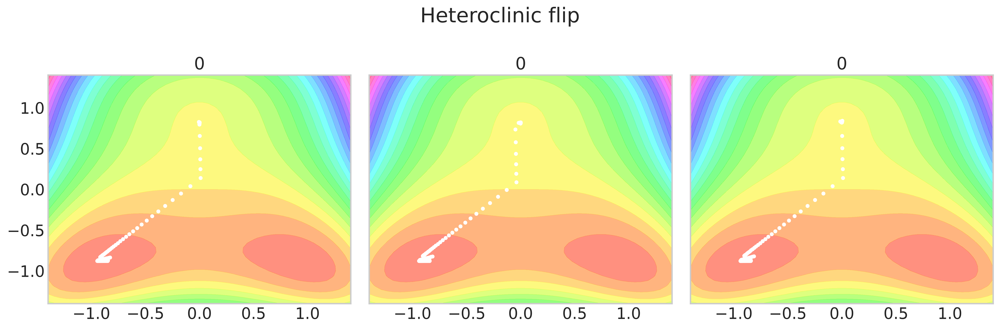

In [68]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(15,5))
axes_list = axes.flatten()

rho_ps = [1, 10, 1000]

for rho_p, ax in tqdm(zip(rho_ps, axes_list)):
    output, attractor_network = simulate_rhos(0, rho_p)

    ylims = 1.4

    x = np.linspace(-1.4, 1.4, 50)
    y = np.linspace(-ylims, ylims, 50)
    X, Y = np.meshgrid(x, y)
    f, k = 0, 1.55

    Z = potential_function(X, Y, f, k)

    ax.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
    
    df = output[['at1', 'at2', 'early epithelium']].T

    ones_row = pd.DataFrame(np.ones((output.shape[0]))).T
    ones_row.columns = df.columns
    df = pd.concat([df, ones_row], axis=0)

    X = np.dot(attractor_network.hx, df)
    Y = np.dot(attractor_network.hy, df)

    ax.scatter(x=X[::4], y=Y[::4], 
                    s=10, color='white', zorder=3, linewidth=1)

#     ax.scatter(x=X[::time], y=Y[::time], 
#                     s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

    ax.grid(False)
    ax.set_title(rho_delt)

# plt.xlabel('X')
# plt.ylabel('Y')
plt.suptitle('Heteroclinic flip')
plt.tight_layout()

plt.show()